# import

In [9]:
# Suppression des warnings FutureWarning
import warnings  # Gère les warnings
warnings.filterwarnings("ignore", category=FutureWarning)

# Librairies générales
import os # Manipulation des données et répertoires
import shutil # Mélanger les données
import zipfile  # Manipulation des archives ZIP
import numpy as np  # Calcul scientifique et manipulation de matrices
import pandas as pd # Manipulation de données tabulaires

# Librairie d'affichage
import matplotlib.pyplot as plt # Visualisation de données
from matplotlib.offsetbox import (OffsetImage,
                                  AnnotationBbox) # Visualisation de données
from sklearn.manifold import TSNE  # Visualisation dimension réduite
import seaborn as sns # Visualisation de données
from matplotlib import cm  # Colormaps pour les visualisations 3D ou KDE
from mpl_toolkits.mplot3d import Axes3D  # Support pour les graphiques 3D
from scipy.stats import gaussian_kde  # Estimation de densité par noyau (KDE)
from PIL import Image  # Chargement et traitement d'images (format standard)

# TensorFlow et Keras
import tensorflow as tf  # API principale de TensorFlow
from tensorflow.keras.preprocessing.image import ImageDataGenerator # Générateur
from tensorflow.keras.layers import (Layer, Input, Conv2D, Flatten,
                                    Dense, Lambda, LeakyReLU,
                                    Conv2DTranspose, Reshape,
                                    BatchNormalization,
                                    Cropping2D) # Différentes couches
from tensorflow.keras.models import Model # Définition/chargement des modèles
from tensorflow.keras import backend as K # Import opérations bas niveau
from tensorflow.keras.callbacks import (ModelCheckpoint,
                                        EarlyStopping) # Gestion des callbacks
from tensorflow.keras.preprocessing.image import (array_to_img,
                                                  load_img,
                              img_to_array) # Manipulation d'images avec Keras
from tensorflow.keras.utils import register_keras_serializable # Sérialisation
from tensorflow.keras.models import load_model  # Chargement modèle

# Scikit learn
from sklearn.cluster import KMeans # Pour calculer les clusters
from sklearn.metrics import silhouette_score # Pour calcul nombre de clusters

# dataset

In [10]:
# Nom local de l'archive et URL source
zip_file = "Data_humanface_cat_without_caption_1000.zip"
zip_url = "https://www.lirmm.fr/~poncelet/Ressources/Data_humanface_cat_without_caption_1000.zip"

# Répertoire cible après extraction
src_dir = "Data_humanface_cat_without_caption_1000"
legacy_dir = "images"

# Vérifie s'il y a au moins une image .jpg dans un dossier
def dataset_already_present(dataset_dir):
    if not os.path.exists(dataset_dir):
        return False
    for root, dirs, files in os.walk(dataset_dir):
        if any(f.lower().endswith(".jpg") for f in files):
            return True
    return False


# Téléchargement et extraction seulement si nécessaire
if not dataset_already_present(src_dir):
    print("Aucune image trouvée dans Data_humanface_cat_without_caption_1000. Extraction en cours...")
    os.makedirs(src_dir, exist_ok=True)

    # Télécharger si l'archive n'est pas déjà présente
    if not os.path.exists(zip_file):
        print(f"Téléchargement de {zip_file}...")
        !Powershell.exe -Command ((new-object System.Net.WebClient).DownloadFile('{zip_url}','{zip_file}'))
    else:
        print(f"{zip_file} déjà présent, téléchargement ignoré.")

    # Extraction dans src_dir, même si l'archive contient un dossier 'images/'
    with zipfile.ZipFile(zip_file, "r") as zip_ref:
        for member in zip_ref.infolist():
            member_name = member.filename.replace("\\", "/")

            if member_name.startswith("__MACOSX") or member_name.endswith("/"):
                continue

            parts = [part for part in member_name.split("/") if part and part != "__MACOSX"]
            if not parts:
                continue

            if parts[0] in {src_dir, legacy_dir}:
                parts = parts[1:]

            if not parts:
                continue

            destination_path = os.path.join(src_dir, *parts)
            os.makedirs(os.path.dirname(destination_path), exist_ok=True)

            with zip_ref.open(member) as source, open(destination_path, "wb") as target:
                shutil.copyfileobj(source, target)

    print("Archive extraite avec succès dans Data_humanface_cat_without_caption_1000.")
    os.remove(zip_file)
else:
    print("Le dossier Data_humanface_cat_without_caption_1000 existe déjà et contient des images.")

Le dossier Data_humanface_cat_without_caption_1000 existe déjà et contient des images.


In [11]:
# Configuration générale pour les données
image_height = 256  # Hauteur des images
image_width = 256   # Largeur des images
image_size = (image_height, image_width, 3)  # Dimensions des images

# Pour les modèles
batch_size = 64     # Taille des lots
latent_dim = 16     # Dimension de l'espace latent pour le VAE

model_dir = "../models/"
os.makedirs(model_dir, exist_ok=True)

# Les classes sont séparées par dossier dans Data_humanface_cat_without_caption_1000.
dataset_root = "./Data_humanface_cat_without_caption_1000"
class_directories = {
    "humain": "man",
    "chat": "cat"
}

dataset_configs = {
    "humain_seul": {
        "path": dataset_root,
        "class_dirs": (class_directories["humain"],)
    },
    "chat_seul": {
        "path": dataset_root,
        "class_dirs": (class_directories["chat"],)
    },
    "humain_chat": {
        "path": dataset_root,
        "class_dirs": (class_directories["humain"], class_directories["chat"])
    }
}

In [12]:
def extract_image_labels(dataset_name, dataset_dir, class_dirs, save_dir):
    """
    Extrait les chemins de fichiers et labels depuis les sous-dossiers d'un
    dataset puis les sauvegarde dans un fichier .npz.


    Args:
        dataset_name : str, nom du dataset (pour nommer le fichier .npz)
        dataset_dir  : str, chemin racine du dataset
        class_dirs   : iterable[str], sous-dossiers de classes à conserver
        save_dir     : str, chemin où sauvegarder le fichier .npz
    """
    dir_to_label = {directory: label for label, directory in class_directories.items()}
    class_dirs = tuple(class_dirs)

    filenames = []
    labels = []

    for class_dir in class_dirs:
        class_path = os.path.join(dataset_dir, class_dir)
        if not os.path.isdir(class_path):
            raise ValueError(f"Le dossier de classe '{class_path}' est introuvable.")

        for file_name in sorted(os.listdir(class_path)):
            if not file_name.lower().endswith((".jpg", ".jpeg", ".png")):
                continue

            filenames.append(os.path.join(class_dir, file_name))
            labels.append(dir_to_label.get(class_dir, class_dir))

    if not filenames:
        raise ValueError(
            f"Aucune image trouvée dans {dataset_dir} pour les dossiers {class_dirs}"
        )

    filenames = np.array(filenames)
    labels = np.array(labels)

    save_path = os.path.join(save_dir, f"{dataset_name}_image_labels.npz")
    np.savez(save_path, filenames=filenames, labels=labels)


for dataset_name, dataset_config in dataset_configs.items():
    extract_image_labels(
        dataset_name=dataset_name,
        dataset_dir=dataset_config["path"],
        class_dirs=dataset_config["class_dirs"],
        save_dir=model_dir
    )

# models

In [13]:
# Fonction d'échantillonnage
@register_keras_serializable(package='Custom', name='sampling')
def sampling(args):
    mean_mu, log_var = args
    epsilon = K.random_normal(shape=K.shape(mean_mu), mean=0., stddev=1.)
    return mean_mu + K.exp(log_var / 2) * epsilon

# Couche de perte KL intégrée
@register_keras_serializable(package='Custom', name='KLLossLayer')
class KLLossLayer(tf.keras.layers.Layer):
    def __init__(self, beta=1.0, **kwargs):
        """
        Couche personnalisée pour la perte KL avec facteur de pondération.
        Paramètres:
        - beta : float, coefficient pour ajuster l'impact de la perte KL.
        """
        super(KLLossLayer, self).__init__(**kwargs)
        self.beta = beta

    def call(self, inputs):
        mean_mu, log_var = inputs
        # Calcul de la divergence KL entre la distribution latente
        # et une normale standard
        kl_loss = -0.5 * tf.reduce_sum(1 + log_var - tf.square(mean_mu) - tf.exp(log_var),
                                        axis=1)
        self.add_loss(self.beta * tf.reduce_mean(kl_loss))#Moyenne sur batch
        return kl_loss


# VAE Encoder
def build_vae_encoder(input_dim, latent_dim, beta=1.0):
    """
    Construit l'encodeur d'un Variational Autoencoder (VAE) avec un facteur
    de pondération pour la perte KL.

    Parameters:
    - input_dim : tuple
        Dimension d'entrée des images (hauteur, largeur, canaux).
    - latent_dim : int
        Dimension de l'espace latent.
    - beta : float, optionnel
        Coefficient pour ajuster l'impact de la perte KL (par défaut 1.0).

    Returns:
    - tuple contenant les composants de l'encodeur.
    """
    tf.keras.backend.clear_session()

    # Définir l'entrée de l'encodeur
    vae_encoder_input = Input(shape=input_dim, name='vae_encoder_input')
    x = vae_encoder_input

    # Couches convolutives
    x = Conv2D(32, 3, strides=2, padding='same', name='vae_encoder_conv_1')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)
    x = Conv2D(64, 3, strides=2, padding='same', name='vae_encoder_conv_2')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)
    x = Conv2D(64, 3, strides=2, padding='same', name='vae_encoder_conv_3')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)
    x = Conv2D(64, 3, strides=2, padding='same', name='vae_encoder_conv_4')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)

    # Capture de la forme avant le Flatten
    shape_before_flattening = tf.keras.backend.int_shape(x)[1:]
    x = Flatten()(x)

    # Moyenne et variance log
    mean_mu = Dense(latent_dim, name='mu')(x)
    log_var = Dense(latent_dim, name='log_var')(x)

    

    # Application du sampling
    vae_encoder_output = Lambda(sampling, output_shape=(latent_dim,),
                                name='vae_encoder_output')([mean_mu, log_var])

    

    # Ajout de la couche KL à l'encodeur
    kl_loss_layer = KLLossLayer(beta=beta, name='kl_loss')([mean_mu, log_var])

    # Construction du modèle
    vae_encoder = Model(vae_encoder_input, vae_encoder_output,
                        name='vae_encoder')

    return vae_encoder_input, vae_encoder_output, mean_mu, log_var, shape_before_flattening, vae_encoder

In [14]:

# Facteur de pondération pour la divergence KL
beta = 3

# Création de l'encodeur VAE
vae_encoder_input, vae_encoder_output, mean_mu, log_var, shape_before_flattening, vae_encoder = build_vae_encoder(
    image_size,
    latent_dim,
    beta=beta
)

vae_encoder.summary()

Model: "vae_encoder"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ vae_encoder_input   │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ vae_encoder_conv_1  │ (None, 128, 128,  │        896 │ vae_encoder_inpu… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 128, 128,  │        128 │ vae_encoder_conv… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu         │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ vae_encoder_conv_2  │ (None, 64, 64,    │     18,496 │ leaky_re_lu[0][0] │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        256 │ vae_encoder_conv… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_1       │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ vae_encoder_conv_3  │ (None, 32, 32,    │     36,928 │ leaky_re_lu_1[0]… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │        256 │ vae_encoder_conv… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_2       │ (None, 32, 32,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ vae_encoder_conv_4  │ (None, 16, 16,    │     36,928 │ leaky_re_lu_2[0]… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 16, 16,    │        256 │ vae_encoder_conv… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_3       │ (None, 16, 16,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten (Flatten)   │ (None, 16384)     │          0 │ leaky_re_lu_3[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ mu (Dense)          │ (None, 16)        │    262,160 │ flatten[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ log_var (Dense)     │ (None, 16)        │    262,160 │ flatten[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ vae_encoder_output  │ (None, 16)        │          0 │ mu[0][0],         │
│ (Lambda)            │                   │            │ log_var[0][0]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 618,464 (2.36 MB)

 Trainable params: 618,016 (2.36 MB)

 Non-trainable params: 448 (1.75 KB)

In [15]:
def build_vae_decoder(latent_dim, shape_before_flattening):
    """
    Construit le décodeur pour reconstruire une image à partir de
    l'espace latent.


    Parameters:
    - latent_dim : Dimension de l'espace latent.
    - shape_before_flattening : Dimensions avant Flatten
    (hauteur, largeur, canaux).

    Returns:
    - decoder_input : Input du modèle décodeur.
    - decoder_output : Sortie reconstruite.
    - decoder : Modèle complet du décodeur.
    """
    decoder_input = Input(shape=(latent_dim,), name='decoder_input')

    # Transformation dense vers une forme aplatie
    total_units = np.prod(shape_before_flattening)  # Produit des dimensions
    x = Dense(total_units, activation='relu',
              name='decoder_dense')(decoder_input)

    # Reshape pour correspondre à la représentation avant Flatten de l'encodeur
    x = Reshape(shape_before_flattening, name='decoder_reshape')(x)

    # Reconstruction de l'image avec des convolutions transposées
    x = Conv2DTranspose(64, kernel_size=3, strides=2, padding='same',
                        name='decoder_conv_1')(x)  # 16x16 en 32x32
    x = LeakyReLU(name='decoder_activation_1')(x)

    x = Conv2DTranspose(64, kernel_size=3, strides=2, padding='same',
                        name='decoder_conv_2')(x)  # 32x32 en 64x64
    x = LeakyReLU(name='decoder_activation_2')(x)

    x = Conv2DTranspose(32, kernel_size=3, strides=2, padding='same',
                        name='decoder_conv_3')(x)  # 64x64 en 128x128
    x = LeakyReLU(name='decoder_activation_3')(x)

    # Avec un input 256x256 et 4 strides de 2, on revient exactement à 256x256
    decoder_output = Conv2DTranspose(
        3,
        kernel_size=3,
        strides=2,
        padding='same',
        activation='sigmoid',
        name='decoder_conv_4'
    )(x)  # 128x128 en 256x256

    return decoder_input, decoder_output, Model(decoder_input, decoder_output,
                                                name="vae_decoder")

In [16]:
# Création du décodeur VAE
vae_decoder_input, vae_decoder_output, vae_decoder = build_vae_decoder(
    latent_dim,
    shape_before_flattening=shape_before_flattening
)

vae_decoder.summary()

Model: "vae_decoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ decoder_input (InputLayer)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_dense (Dense)           │ (None, 16384)          │       278,528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_reshape (Reshape)       │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_conv_1                  │ (None, 32, 32, 64)     │        36,928 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_activation_1            │ (None, 32, 32, 64)     │             0 │
│ (LeakyReLU)                     │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_conv_2                  │ (None, 64, 64, 64)     │        36,928 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_activation_2            │ (None, 64, 64, 64)     │             0 │
│ (LeakyReLU)                     │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_conv_3                  │ (None, 128, 128, 32)   │        18,464 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_activation_3            │ (None, 128, 128, 32)   │             0 │
│ (LeakyReLU)                     │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_conv_4                  │ (None, 256, 256, 3)    │           867 │
│ (Conv2DTranspose)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 371,715 (1.42 MB)

 Trainable params: 371,715 (1.42 MB)

 Non-trainable params: 0 (0.00 B)

In [17]:
def create_vae():
    """
    Crée une nouvelle instance du VAE avec les mêmes paramètres que l'original.
    Returns:
    - vae : Model
        Une nouvelle instance du modèle VAE.
    """
    # Création de l'encodeur et du décodeur
    vae_encoder_input, vae_encoder_output, mean_mu, log_var, shape_before_flattening, vae_encoder = build_vae_encoder(
        input_dim=image_size,
        latent_dim=latent_dim,
        beta=beta
    )
    vae_decoder_input, vae_decoder_output, vae_decoder = build_vae_decoder(
        latent_dim=latent_dim,
        shape_before_flattening=shape_before_flattening
    )

    vae_autoencoder_input = vae_encoder_input
    vae_autoencoder_output = vae_decoder(vae_encoder_output)
    vae = Model(inputs=vae_autoencoder_input, outputs=vae_autoencoder_output,
                name="vae_autoencoder")

    # Compilation du modèle
    vae.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005),
                loss="mse")
    return vae

In [18]:
# Creation d'un vae pour vérifier que le modèle est bon
vae = create_vae()

vae.summary()

Model: "vae_autoencoder"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ vae_encoder_input   │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ vae_encoder_conv_1  │ (None, 128, 128,  │        896 │ vae_encoder_inpu… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 128, 128,  │        128 │ vae_encoder_conv… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu         │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ vae_encoder_conv_2  │ (None, 64, 64,    │     18,496 │ leaky_re_lu[0][0] │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        256 │ vae_encoder_conv… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_1       │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ vae_encoder_conv_3  │ (None, 32, 32,    │     36,928 │ leaky_re_lu_1[0]… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │        256 │ vae_encoder_conv… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_2       │ (None, 32, 32,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ vae_encoder_conv_4  │ (None, 16, 16,    │     36,928 │ leaky_re_lu_2[0]… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 16, 16,    │        256 │ vae_encoder_conv… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_3       │ (None, 16, 16,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten (Flatten)   │ (None, 16384)     │          0 │ leaky_re_lu_3[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ mu (Dense)          │ (None, 16)        │    262,160 │ flatten[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ log_var (Dense)     │ (None, 16)        │    262,160 │ flatten[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ vae_encoder_output  │ (None, 16)        │          0 │ mu[0][0],         │
│ (Lambda)            │                   │            │ log_var[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ vae_decoder         │ (None, 256, 256,  │    371,715 │ vae_encoder_outp

 Total params: 990,179 (3.78 MB)

 Trainable params: 989,731 (3.78 MB)

 Non-trainable params: 448 (1.75 KB)

# datagen

In [19]:
def create_data_generator(dataset_dir, class_dirs, image_size, batch_size):
    """
    Crée un générateur d'images à partir des sous-dossiers de classes.


    Args:
        dataset_dir (str): Chemin racine du dataset.
        class_dirs (iterable[str]): Sous-dossiers de classes à inclure.
        image_size (tuple): Dimensions cibles des images (hauteur, largeur).
        batch_size (int): Taille des lots.


    Returns:
        data_gen (Iterator): Générateur Keras d'images normalisées.
    """
    class_dirs = tuple(class_dirs)
    filenames = []

    for class_dir in class_dirs:
        class_path = os.path.join(dataset_dir, class_dir)
        if not os.path.isdir(class_path):
            raise ValueError(f"Le dossier de classe '{class_path}' est introuvable.")

        for file_name in sorted(os.listdir(class_path)):
            if not file_name.lower().endswith((".jpg", ".jpeg", ".png")):
                continue
            filenames.append(os.path.join(class_dir, file_name))

    if not filenames:
        raise ValueError(
            f"Aucune image trouvée dans {dataset_dir} pour les dossiers {class_dirs}"
        )

    data_frame = pd.DataFrame({
        "filename": filenames,
        "target": filenames
    })

    generator = ImageDataGenerator(rescale=1./255)

    data_gen = generator.flow_from_dataframe(
        dataframe=data_frame,
        directory=dataset_dir,
        x_col='filename',
        y_col='target',
        target_size=image_size,
        batch_size=batch_size,
        shuffle=True,
        seed=42,
        class_mode='input',
        color_mode='rgb',
        validate_filenames=True
    )

    return data_gen


def train_vae(model, data_gen, model_path, epochs=100, patience=10):
    """
    Entraîne un VAE sans validation avec callbacks intégrés.


    Args:
        model (Model): Modèle VAE compilé.
        data_gen (Iterator): Générateur Keras.
        model_path (str): Chemin pour sauvegarde du meilleur modèle.
        epochs (int): Nombre maximal d’époques.
        patience (int): Patience pour EarlyStopping.


    Returns:
        History: Historique d’entraînement.
    """
    callbacks = [
        EarlyStopping(monitor='loss', patience=patience, mode='min',
                      restore_best_weights=True, verbose=1),
        ModelCheckpoint(filepath=model_path, monitor='loss',
                        save_best_only=True, save_weights_only=False,
                        verbose=1, mode='min')
    ]

    history = model.fit(
        data_gen,
        epochs=epochs,
        callbacks=callbacks,
        verbose=1
    )

    return history

In [20]:
for dataset_name, dataset_config in dataset_configs.items():
    test_gen = create_data_generator(
        dataset_dir=dataset_config["path"],
        class_dirs=dataset_config["class_dirs"],
        image_size=(image_height, image_width),
        batch_size=batch_size
    )
    print(dataset_name, test_gen.samples)

Found 1000 validated image filenames.
humain_seul 1000
Found 1000 validated image filenames.
chat_seul 1000
Found 2000 validated image filenames.
humain_chat 2000


# train

In [34]:
epochs = 400

# Jeu de données des humains seuls
vae_humain_seul = create_vae()
model_path = os.path.join(model_dir, "vaeplus_best_humain_seul.keras")
dataset_config = dataset_configs["humain_seul"]
data_gen = create_data_generator(
    dataset_dir=dataset_config["path"],
    class_dirs=dataset_config["class_dirs"],
    image_size=(image_height, image_width),
    batch_size=batch_size
 )
train_vae(vae_humain_seul, data_gen, model_path, epochs)

# Jeu de données chat seul
vae_chat_seul = create_vae()
model_path = os.path.join(model_dir, "vaeplus_best_chat_seul.keras")
dataset_config = dataset_configs["chat_seul"]
data_gen = create_data_generator(
    dataset_dir=dataset_config["path"],
    class_dirs=dataset_config["class_dirs"],
    image_size=(image_height, image_width),
    batch_size=batch_size
 )
train_vae(vae_chat_seul, data_gen, model_path, epochs)

# Jeu de données humain chat
vae_humain_chat = create_vae()
model_path = os.path.join(model_dir, "vaeplus_best_humain_chat.keras")
dataset_config = dataset_configs["humain_chat"]
data_gen = create_data_generator(
    dataset_dir=dataset_config["path"],
    class_dirs=dataset_config["class_dirs"],
    image_size=(image_height, image_width),
    batch_size=batch_size
 )
train_vae(vae_humain_chat, data_gen, model_path, epochs)

Found 1000 validated image filenames.
Epoch 1/400
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step - loss: 0.0881
Epoch 1: loss improved from None to 0.08827, saving model to ../models/vaeplus_best_humain_seul.keras
16/16 ━━━━━━━━━━━━━━━━━━━━ 7s 338ms/step - loss: 0.0883
Epoch 2/400
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step - loss: 0.0841
Epoch 2: loss improved from 0.08827 to 0.08062, saving model to ../models/vaeplus_best_humain_seul.keras
16/16 ━━━━━━━━━━━━━━━━━━━━ 5s 338ms/step - loss: 0.0806
Epoch 3/400
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step - loss: 0.0713
Epoch 3: loss improved from 0.08062 to 0.06922, saving model to ../models/vaeplus_best_humain_seul.keras
16/16 ━━━━━━━━━━━━━━━━━━━━ 5s 335ms/step - loss: 0.0692
Epoch 4/400
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step - loss: 0.0645
Epoch 4: loss improved from 0.06922 to 0.06321, saving model to ../models/vaeplus_best_humain_seul.keras
16/16 ━━━━━━━━━━━━━━━━━━━━ 6s 342ms/step - loss: 0.0632
Epoch 5/400
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/s

# experiments

## load models

In [21]:
# Pour les humains seuls
model_path = os.path.join(model_dir, "vaeplus_best_humain_seul.keras")
vae_humain_seul = load_model(
    model_path,
    custom_objects={
        "sampling": sampling,
        "KLLossLayer": KLLossLayer
    }
)
print("Modèle vae_humains_seuls chargé.")

# Pour les chats seuls
model_path = os.path.join(model_dir, "vaeplus_best_chat_seul.keras")
vae_chat_seul = load_model(
    model_path,
    custom_objects={
        "sampling": sampling,
        "KLLossLayer": KLLossLayer
    }
)
print("Modèle vae_chats_seuls chargé.")

# Pour les humains et les chats
model_path = os.path.join(model_dir,
                          "vaeplus_best_humain_chat.keras")
vae_humain_chat = load_model(
    model_path,
    custom_objects={
        "sampling": sampling,
        "KLLossLayer": KLLossLayer
    }
)
print("Modèle vae_humains_chats chargé.")

Modèle vae_humains_seuls chargé.
Modèle vae_chats_seuls chargé.
Modèle vae_humains_chats chargé.


## utils

In [22]:
def plot_vae_reconstructions(vae_model, data_gen, title=None):
    """
    Affiche 10 images originales et leurs reconstructions par le VAE.

    Args:
        vae_model : modèle VAE chargé
        data_gen  : générateur de données (ImageDataGenerator)
        title     : titre facultatif pour le graphique
    """
    x_batch = next(data_gen)
    if isinstance(x_batch, tuple):
        x_batch = x_batch[0]

    x_batch = x_batch[:10]
    reconstructions = vae_model.predict(x_batch, verbose=0)

    fig = plt.figure(figsize=(15, 5))

    for i in range(10):
        ax = plt.subplot(2, 10, i + 1)
        plt.imshow(np.clip(x_batch[i], 0, 1))
        plt.axis("off")

        ax = plt.subplot(2, 10, i + 11)
        plt.imshow(np.clip(reconstructions[i], 0, 1))
        plt.axis("off")

    if title:
        fig.suptitle(title, fontsize=14, fontweight='bold', y=0.93)

    fig.text(0.5, 0.76, "Images Originales", fontsize=14, ha='center')
    fig.text(0.5, 0.10, "Images Reconstruites", fontsize=14, ha='center')

    plt.tight_layout(rect=[0, 0.05, 1, 0.86])
    plt.show()

## plots

Found 1000 validated image filenames.


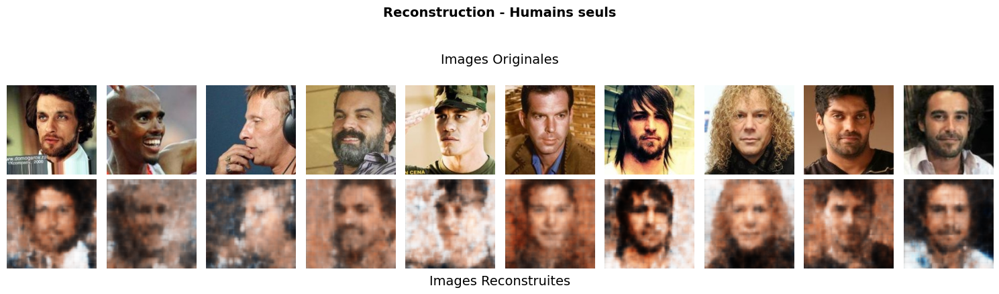

Found 1000 validated image filenames.


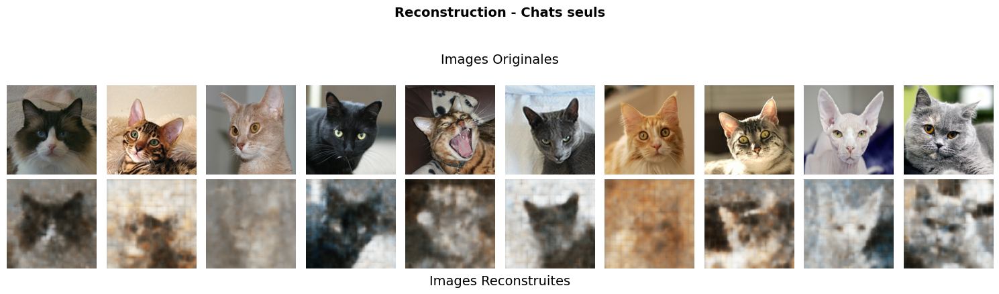

Found 2000 validated image filenames.


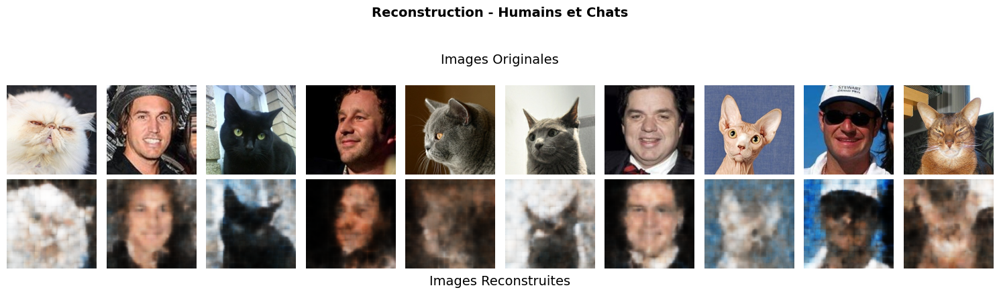

In [23]:
dataset_config = dataset_configs["humain_seul"]
data_gen_humains_seuls = create_data_generator(
    dataset_dir=dataset_config["path"],
    class_dirs=dataset_config["class_dirs"],
    image_size=(image_height, image_width),
    batch_size=batch_size
)
plot_vae_reconstructions(vae_humain_seul, data_gen_humains_seuls,
                         title="Reconstruction - Humains seuls")

dataset_config = dataset_configs["chat_seul"]
data_gen_chats_seuls = create_data_generator(
    dataset_dir=dataset_config["path"],
    class_dirs=dataset_config["class_dirs"],
    image_size=(image_height, image_width),
    batch_size=batch_size
)
plot_vae_reconstructions(vae_chat_seul, data_gen_chats_seuls,
                         title="Reconstruction - Chats seuls")
dataset_config = dataset_configs["humain_chat"]
data_gen_humain_chat = create_data_generator(
    dataset_dir=dataset_config["path"],
    class_dirs=dataset_config["class_dirs"],
    image_size=(image_height, image_width),
    batch_size=batch_size
)
plot_vae_reconstructions(vae_humain_chat,
                         data_gen_humain_chat,
                         title="Reconstruction - Humains et Chats")

## latent - space

In [24]:
def plot_latent_space_with_density(
    vae_model,
    dataset_name,
    dataset_paths,
    model_dir,
    num_samples=500,
    grid_size=100,
    image_size=(28, 28),
    zoom=0.6,
    random_state=42
):
    """
    Affiche côte à côte :
    - à gauche : le t-SNE avec vignettes d'images
    - à droite : la densité estimée ("montagnes") dans l'espace latent

    Args:
        vae_model     : modèle VAE (avec la couche "vae_encoder_output")
        dataset_name  : nom du dataset (clé dans dataset_paths)
        dataset_paths : dict des chemins des datasets
        model_dir     : répertoire des fichiers .npz
        num_samples   : nombre d'images à utiliser
        grid_size     : résolution de la grille KDE
        image_size    : taille de chaque vignette (pixels)
        zoom          : facteur de zoom pour les vignettes
        random_state  : graine pour l'échantillonnage des images
    """
    dataset_dir = dataset_paths[dataset_name]["path"]
    label_file = os.path.join(model_dir, f"{dataset_name}_image_labels.npz")

    data = np.load(label_file)
    filenames = data["filenames"]
    labels = data["labels"]

    rng = np.random.default_rng(random_state)
    unique_labels = np.unique(labels)
    target_size = min(num_samples, len(filenames))

    if target_size < len(unique_labels):
        selected_indices = rng.choice(len(filenames), size=target_size, replace=False)
    else:
        selected_parts = []
        base_quota = target_size // len(unique_labels)
        remainder = target_size % len(unique_labels)

        for label in unique_labels:
            label_indices = np.where(labels == label)[0]
            quota = min(base_quota, len(label_indices))
            if quota > 0:
                selected_parts.append(
                    rng.choice(label_indices, size=quota, replace=False)
                )

        selected_indices = np.concatenate(selected_parts) if selected_parts else np.array([], dtype=int)
        remaining_pool = np.setdiff1d(np.arange(len(filenames)), selected_indices, assume_unique=False)

        if remainder > 0 and len(remaining_pool) > 0:
            extra_size = min(remainder, len(remaining_pool))
            extra_indices = rng.choice(remaining_pool, size=extra_size, replace=False)
            selected_indices = np.concatenate([selected_indices, extra_indices])

        if len(selected_indices) < target_size:
            remaining_pool = np.setdiff1d(np.arange(len(filenames)), selected_indices, assume_unique=False)
            missing = min(target_size - len(selected_indices), len(remaining_pool))
            if missing > 0:
                extra_indices = rng.choice(remaining_pool, size=missing, replace=False)
                selected_indices = np.concatenate([selected_indices, extra_indices])

    selected_indices = rng.permutation(selected_indices)
    filenames = filenames[selected_indices]
    labels = labels[selected_indices]

    images = [
        np.array(Image.open(os.path.join(dataset_dir, f))) / 255.0
        for f in filenames
    ]
    x = np.stack(images)

    encoder_output = vae_model.get_layer("vae_encoder_output").output
    encoder = Model(inputs=vae_model.input, outputs=encoder_output)
    z = encoder.predict(x, verbose=0)
    z_tsne = TSNE(n_components=2, random_state=42).fit_transform(z)

    fig = plt.figure(figsize=(16, 7))

    # --- Subplot gauche : t-SNE avec vignettes ---
    ax1 = fig.add_subplot(1, 2, 1)
    ax1.set_title(f"t-SNE avec vignettes — {dataset_name}", fontsize=14)

    for i, (x_tsne, y_tsne) in enumerate(z_tsne):
        thumb = array_to_img(x[i])
        thumb = thumb.resize(image_size)
        imagebox = OffsetImage(thumb, zoom=zoom)
        ab = AnnotationBbox(imagebox, (x_tsne, y_tsne), frameon=False)
        ax1.add_artist(ab)

    ax1.set_xlim(z_tsne[:, 0].min() - 5, z_tsne[:, 0].max() + 5)
    ax1.set_ylim(z_tsne[:, 1].min() - 5, z_tsne[:, 1].max() + 5)
    ax1.set_xticks([])
    ax1.set_yticks([])
    ax1.grid(False)

    # --- Subplot droit : densité KDE 3D ---
    kde = gaussian_kde(z_tsne.T)
    x_vals = np.linspace(z_tsne[:, 0].min() - 5, z_tsne[:, 0].max() + 5,
                         grid_size)
    y_vals = np.linspace(z_tsne[:, 1].min() - 5, z_tsne[:, 1].max() + 5,
                         grid_size)
    X, Y = np.meshgrid(x_vals, y_vals)
    Z = kde(np.vstack([X.ravel(), Y.ravel()])).reshape(X.shape)

    ax2 = fig.add_subplot(1, 2, 2, projection='3d')
    ax2.plot_surface(X, Y, Z, cmap=cm.viridis, edgecolor='k', linewidth=0.1)
    ax2.set_title("Densité estimée dans l'espace latent", fontsize=14)
    ax2.set_xlabel("Latent dim 1")
    ax2.set_ylabel("Latent dim 2")
    ax2.set_zlabel("Densité")

    plt.tight_layout()
    plt.show()

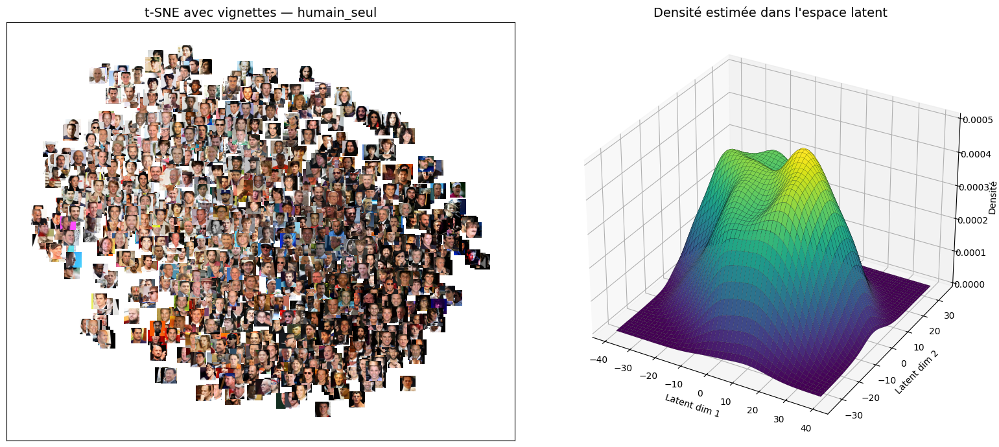

In [25]:
plot_latent_space_with_density(
    vae_model=vae_humain_seul,
    dataset_name="humain_seul",
    dataset_paths=dataset_configs,
    model_dir=model_dir,
    num_samples=1000
)

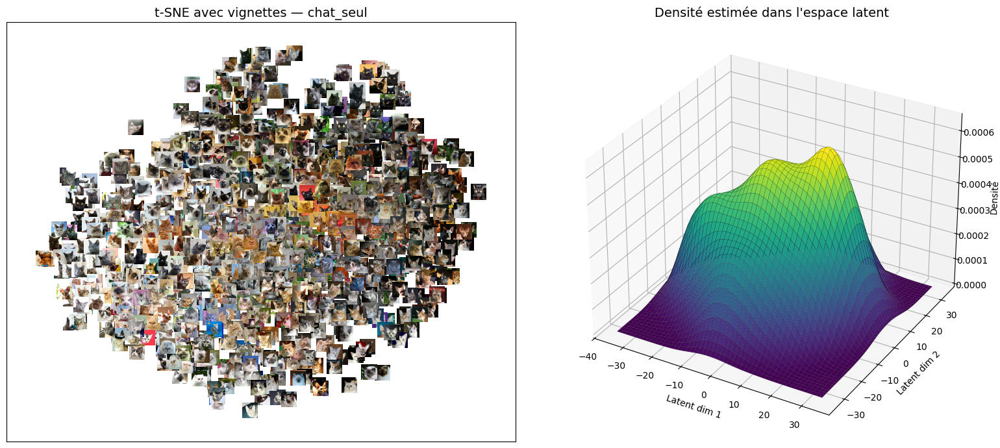

In [26]:
plot_latent_space_with_density(
    vae_model=vae_chat_seul,
    dataset_name="chat_seul",
    dataset_paths=dataset_configs,
    model_dir=model_dir,
    num_samples=1000
)

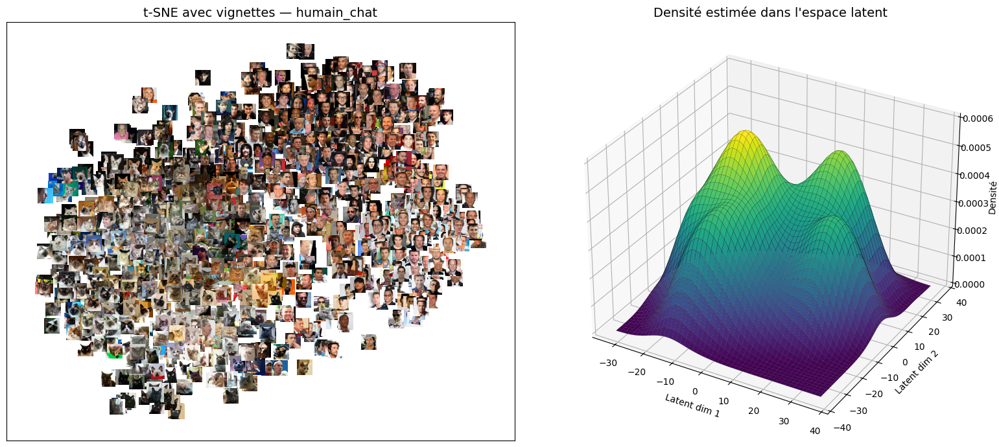

In [27]:
plot_latent_space_with_density(
    vae_model=vae_humain_chat,
    dataset_name="humain_chat",
    dataset_paths=dataset_configs,
    model_dir=model_dir,
    num_samples=1000
)

## histogramme vec latents

In [28]:
def plot_latent_histogram_from_vae(
    vae_model,
    dataset_name,
    dataset_paths,
    model_dir,
    title="Histogramme des vecteurs latents",
    dimensions=8,
    bins=50
):
    """
    Affiche un histogramme groupé des valeurs latentes pour chaque catégorie.

    Args:
        vae_model     : modèle VAE complet
        dataset_name  : nom du dataset dans dataset_paths
        dataset_paths : dict {nom: chemin}
        model_dir     : chemin vers les fichiers .npz
        title         : titre du graphique
        dimensions    : nombre de dimensions latentes à inclure (par défaut: 8)
        bins          : nombre de bins dans l'histogramme
    """
    label_map = {"t": "tomate", "p": "poire", "b": "banane"}

    dataset_dir = dataset_paths[dataset_name]["path"]
    label_file = os.path.join(model_dir, f"{dataset_name}_image_labels.npz")
    data = np.load(label_file)
    filenames = data["filenames"]
    labels = data["labels"]

    images = [np.array(Image.open(os.path.join(dataset_dir, f))) / 255.0 for f in filenames]
    x = np.stack(images)

    encoder_output = vae_model.get_layer("vae_encoder_output").output
    encoder = Model(inputs=vae_model.input, outputs=encoder_output)
    latent_vectors = encoder.predict(x, verbose=0)

    dims_to_plot = range(min(dimensions, latent_vectors.shape[1]))

    data = []
    for label_code in np.unique(labels):
        idx = labels == label_code
        name = label_map.get(label_code, str(label_code))
        if np.sum(idx) > 1:
            class_values = latent_vectors[idx][:, dims_to_plot].flatten()
            data.extend([(v, name) for v in class_values])

    if not data:
      print("Pas de catégorie avec suffisamment de données pour l'histogramme.")
      return

    df = pd.DataFrame(data, columns=["Valeur latente", "Catégorie"])
    palette = sns.color_palette("Set2", len(df["Catégorie"].unique()))

    plt.figure(figsize=(12, 6))
    sns.histplot(
        data=df,
        x="Valeur latente",
        hue="Catégorie",
        bins=bins,
        kde=True,
        stat="density",
        element="step",
        palette=palette,
        alpha=0.6
    )
    plt.title(title, fontsize=16, fontweight='bold')
    plt.xlabel("Valeurs des vecteurs latents")
    plt.ylabel("Densité")
    plt.grid(alpha=0.3)
    plt.show()

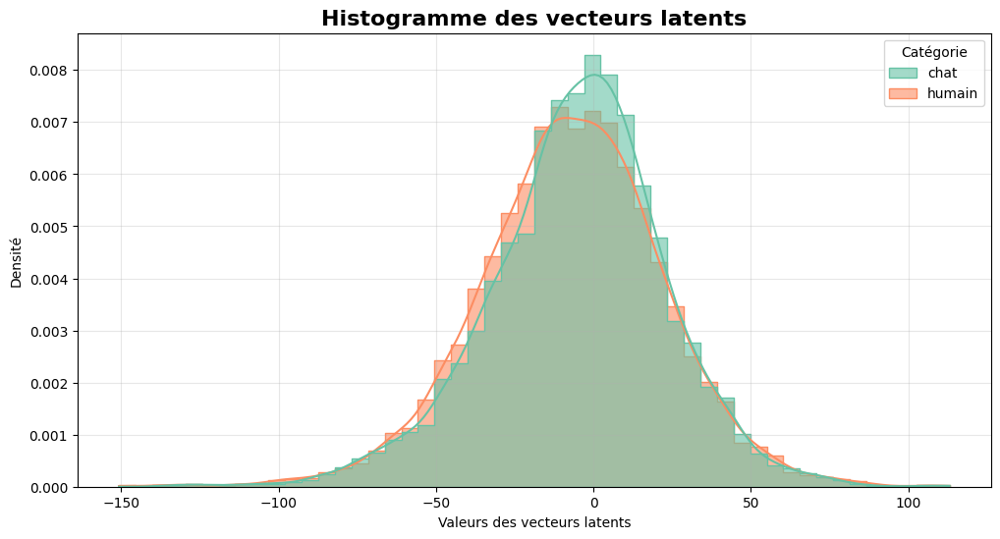

In [29]:
plot_latent_histogram_from_vae(
    vae_model=vae_humain_chat,
    dataset_name="humain_chat",
    dataset_paths=dataset_configs,
    model_dir=model_dir,
    dimensions=8
)

## distributions

In [30]:
def plot_latent_distribution_from_vae(
    vae_model,
    dataset_name,
    dataset_paths,
    model_dir,
    title="Distribution dans l'espace latent",
    dimensions=8
):
    """
    Visualise la distribution KDE des dimensions latentes par catégorie.

    Args:
        vae_model     : modèle VAE complet
        dataset_name  : nom du dataset dans dataset_paths
        dataset_paths : dict {nom: chemin}
        model_dir     : dossier contenant les fichiers .npz
        title         : titre du graphique
        dimensions    : nombre de dimensions latentes à tracer (commençant à 0)
    """
    label_map = {"t": "tomate", "p": "poire", "b": "banane"}

    dataset_dir = dataset_paths[dataset_name]["path"]
    label_file = os.path.join(model_dir, f"{dataset_name}_image_labels.npz")
    data = np.load(label_file)
    filenames = data["filenames"]
    labels = data["labels"]

    images = [np.array(Image.open(os.path.join(dataset_dir, f))) / 255.0 for f in filenames]
    x = np.stack(images)

    encoder_output = vae_model.get_layer("vae_encoder_output").output
    encoder = Model(inputs=vae_model.input, outputs=encoder_output)
    latent_vectors = encoder.predict(x, verbose=0)

    num_latent_dims = latent_vectors.shape[1]
    dims_to_plot = range(min(dimensions, num_latent_dims))

    plt.figure(figsize=(14, 6))
    for i, dim in enumerate(dims_to_plot):
        plt.subplot(2, int(np.ceil(len(dims_to_plot) / 2)), i + 1)
        plotted = False
        for label_code in np.unique(labels):
            idx = labels == label_code
            class_data = latent_vectors[idx, dim]
            if len(class_data) > 1:
                name = label_map.get(label_code, str(label_code))
                sns.kdeplot(class_data, label=name, fill=True, alpha=0.5)
                plotted = True
        plt.title(f"Dimension {dim}")
        plt.xlabel("Valeur latente")
        plt.ylabel("Densité")
        if plotted:
            plt.legend()

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

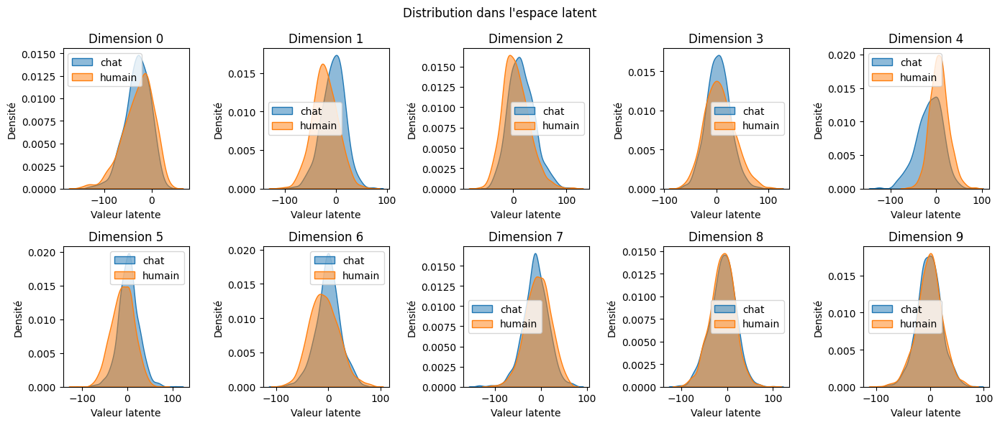

In [31]:
plot_latent_distribution_from_vae(
    vae_model=vae_humain_chat,
    dataset_name="humain_chat",
    dataset_paths=dataset_configs,
    model_dir=model_dir,
    dimensions=10
)

## Génération de données

### décodage aléatoire

In [32]:
def plot_random_latent_decodings(vae_model, latent_dim,
                                 n_images=10,
                                 title="Échantillons générés aléatoirement"):
    """
    Génère et affiche n_images décodées depuis des vecteurs latents tirés
    aléatoirement.

    Args:
        vae_model (tf.keras.Model): Modèle VAE complet (doit contenir un
        décodeur nommé "vae_decoder").
        latent_dim (int): Dimension de l'espace latent.
        n_images (int): Nombre d'images à générer.
        title (str): Titre du graphique.
    """
    decoder = vae_model.get_layer("vae_decoder")
    z_samples = np.random.normal(size=(n_images, latent_dim))
    decoded_images = decoder.predict(z_samples, verbose=0)

    plt.figure(figsize=(n_images * 1.5, 2))
    for i in range(n_images):
        ax = plt.subplot(1, n_images, i + 1)
        plt.imshow(np.clip(decoded_images[i], 0, 1))
        plt.axis("off")

    plt.suptitle(title, fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

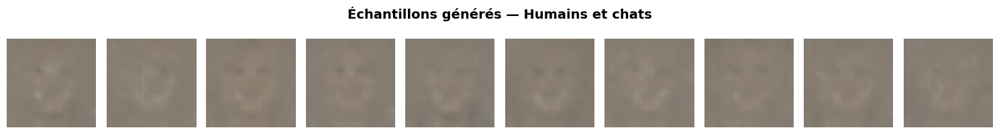

In [33]:
plot_random_latent_decodings(
    vae_model=vae_humain_chat,
    latent_dim=latent_dim,
    n_images=10,
    title="Échantillons générés — Humains et chats"
)

### génération par classes

In [34]:
def generate_images_by_class_from_images(model, dataset_name,
                                         dataset_paths, model_dir,
                                         category_name, num_samples=10,
                                         noise_scale=0.1):
    """
    Génère et affiche des images depuis le VAE à partir d'images d'une classe
    donnée.


    Args:
        model : modèle VAE complet
        dataset_name : nom du dataset (clé dans dataset_paths)
        dataset_paths : dict contenant les chemins vers les datasets
        model_dir : dossier contenant le .npz des labels
        category_name : nom de classe, par ex. "humain" ou "chat"
        num_samples : nombre d'images à générer
        noise_scale : écart-type du bruit latent
    """
    dataset_dir = dataset_paths[dataset_name]["path"]
    label_path = os.path.join(model_dir, f"{dataset_name}_image_labels.npz")
    data = np.load(label_path)
    filenames = data["filenames"]
    labels = data["labels"]

    category_name = category_name.lower()
    class_mask = np.array([str(label).lower() == category_name for label in labels])

    if not np.any(class_mask):
        raise ValueError(
            f"Aucune image trouvée pour la classe '{category_name}' dans '{dataset_name}'."
        )

    selected_filenames = filenames[class_mask]
    images = [
        np.array(Image.open(os.path.join(dataset_dir, file_name))) / 255.0
        for file_name in selected_filenames
    ]
    x = np.stack(images)

    encoder_output = model.get_layer("vae_encoder_output").output
    encoder = Model(inputs=model.input, outputs=encoder_output)
    z_all = encoder.predict(x, verbose=0)

    decoder = model.get_layer("vae_decoder")

    plt.figure(figsize=(15, 2))
    for i in range(num_samples):
        idx = np.random.randint(len(z_all))
        noisy_z = z_all[idx] + np.random.normal(0, noise_scale,
                                                size=z_all.shape[1])
        decoded = decoder.predict(np.expand_dims(noisy_z, axis=0), verbose=0)[0]

        ax = plt.subplot(1, num_samples, i + 1)
        plt.imshow(np.clip(decoded, 0, 1))
        plt.axis("off")

    plt.suptitle(f"Génération aléatoire — {category_name}", fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

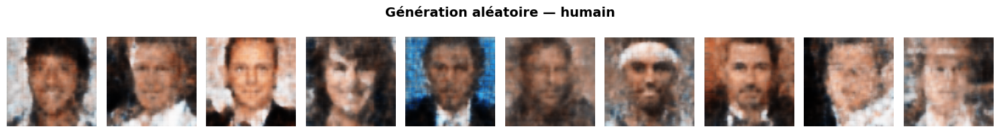

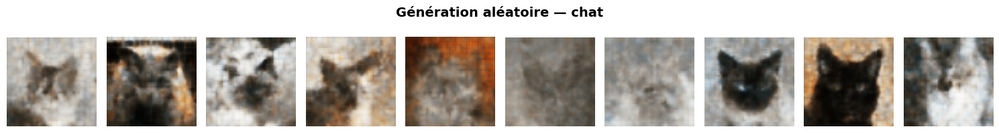

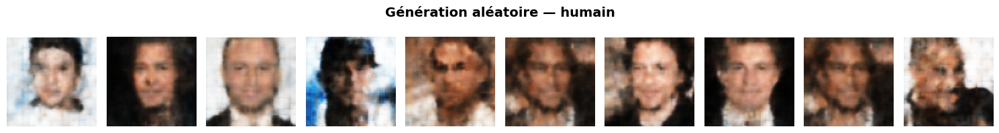

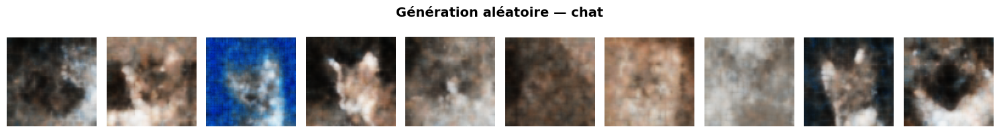

In [35]:
generate_images_by_class_from_images(
    model=vae_humain_seul,
    dataset_name="humain_chat",
    dataset_paths=dataset_configs,
    model_dir=model_dir,
    category_name="humain",
    num_samples=10
)

generate_images_by_class_from_images(
    model=vae_chat_seul,
    dataset_name="chat_seul",
    dataset_paths=dataset_configs,
    model_dir=model_dir,
    category_name="chat",
    num_samples=10
)


generate_images_by_class_from_images(
    model=vae_humain_chat,
    dataset_name="humain_chat",
    dataset_paths=dataset_configs,
    model_dir=model_dir,
    category_name="humain",
    num_samples=10
)

generate_images_by_class_from_images(
    model=vae_humain_chat,
    dataset_name="humain_chat",
    dataset_paths=dataset_configs,
    model_dir=model_dir,
    category_name="chat",
    num_samples=10
)

### génération par apprentissage non supervisé

In [36]:
def generate_images_with_kmeans_from_images(
    model,
    dataset_name,
    dataset_paths,
    model_dir,
    num_samples=5,
    noise_scale=0.1,
    max_k=10
):
    """
    Applique KMeans à l'espace latent extrait depuis le VAE
    et génère des images à partir des centres des clusters.

    Returns:
        x : images d'entrée
        z : vecteurs latents
        cluster_labels : labels KMeans pour chaque image
        best_k : nombre optimal de clusters
        images_by_cluster : dictionnaire {cluster_id: [images générées]}
    """
    dataset_dir = dataset_paths[dataset_name]["path"]
    label_file = os.path.join(model_dir, f"{dataset_name}_image_labels.npz")
    data = np.load(label_file)
    filenames = data["filenames"]

    images = [
        np.array(Image.open(os.path.join(dataset_dir, f))) / 255.0
        for f in filenames
    ]
    x = np.stack(images)

    # Encodeur
    encoder_output = model.get_layer("vae_encoder_output").output
    encoder = Model(inputs=model.input, outputs=encoder_output)
    z = encoder.predict(x, verbose=0)

    # KMeans et score silhouette
    silhouettes, ks = [], range(2, max_k + 1)
    for k in ks:
        km = KMeans(n_clusters=k, random_state=42).fit(z)
        silhouettes.append(silhouette_score(z, km.labels_))
    best_k = ks[np.argmax(silhouettes)]

    kmeans = KMeans(n_clusters=best_k, random_state=42).fit(z)
    cluster_labels = kmeans.labels_

    # Génération depuis les centres
    vae_decoder = model.get_layer("vae_decoder")
    images_by_cluster = {}
    for cluster_id, center in enumerate(kmeans.cluster_centers_):
        cluster_images = []
        for _ in range(num_samples):
            noisy_latent = center + np.random.normal(scale=noise_scale,
                                                     size=center.shape)
            decoded = vae_decoder.predict(np.expand_dims(noisy_latent,
                                                         axis=0), verbose=0)[0]
            cluster_images.append((decoded * 255).astype(np.uint8))
        images_by_cluster[cluster_id] = cluster_images

    return x, z, cluster_labels, best_k, images_by_cluster

def plot_tsne_image_thumbnails(x, z, best_k=None, image_size=(28, 28),
                               zoom=0.6, title="t-SNE avec vignettes d’images"):
    """
    Affiche les images originales en vignettes positionnées selon
    leur projection t-SNE de l’espace latent.

    Args:
        x (np.ndarray): Tableau des images originales.
        z (np.ndarray): Vecteurs latents correspondants.
        best_k (int, optional): Nombre de clusters optimal à
        afficher dans le titre.
        image_size (tuple): Dimensions de chaque vignette.
        zoom (float): Facteur de zoom sur les vignettes.
        title (str): Titre du plot.
    """
    if z.ndim > 2:
        z = z.reshape((z.shape[0], -1))

    tsne = TSNE(n_components=2, random_state=42)
    latent_2d = tsne.fit_transform(z)

    fig, ax = plt.subplots(figsize=(15, 12))
    ax.set_title(f"{title} (k={best_k})" if best_k else title, fontsize=16, fontweight='bold')

    for i, (x_tsne, y_tsne) in enumerate(latent_2d):
        thumb = array_to_img(x[i])
        thumb = thumb.resize(image_size)
        imagebox = OffsetImage(thumb, zoom=zoom)
        ab = AnnotationBbox(imagebox, (x_tsne, y_tsne), frameon=False)
        ax.add_artist(ab)

    ax.set_xlim(latent_2d[:, 0].min() - 5, latent_2d[:, 0].max() + 5)
    ax.set_ylim(latent_2d[:, 1].min() - 5, latent_2d[:, 1].max() + 5)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.grid(False)
    plt.tight_layout()
    plt.show()

def plot_images_by_cluster(images_by_cluster, images_per_row=5,
                           image_size=(2, 2), cmap=None):
    """
    Affiche les images générées par cluster avec un titre 'Cluster X'
    au-dessus de chaque ligne.

    Args:
        images_by_cluster (dict): Dictionnaire {cluster_id: [images]}.
        images_per_row (int): Nombre d’images par ligne.
        image_size (tuple): Taille individuelle de chaque image (w, h).
        cmap (str or None): Colormap à appliquer si images grayscale.
    """
    num_clusters = len(images_by_cluster)
    max_images = max(len(imgs) for imgs in images_by_cluster.values())
    images_per_row = min(images_per_row, max_images)

    fig, axs = plt.subplots(
        num_clusters, images_per_row,
        figsize=(images_per_row * image_size[0], num_clusters * image_size[1])
    )

    if num_clusters == 1:
        axs = [axs]  # force liste si 1 cluster

    for row, (cluster_id, images) in enumerate(images_by_cluster.items()):
        for col in range(images_per_row):
            ax = axs[row][col] if images_per_row > 1 else axs[row]
            if col < len(images):
                ax.imshow(images[col], cmap=cmap)
            ax.axis('off')

        # Ajouter le titre centré au-dessus de la ligne
        mid = images_per_row // 2
        ax_title = axs[row][mid] if images_per_row > 1 else axs[row]
        ax_title.set_title(f"Cluster {cluster_id}", fontsize=12, pad=20, weight="bold")

    plt.suptitle("Images générées par cluster", fontsize=14, weight="bold")
    plt.tight_layout()
    plt.show()

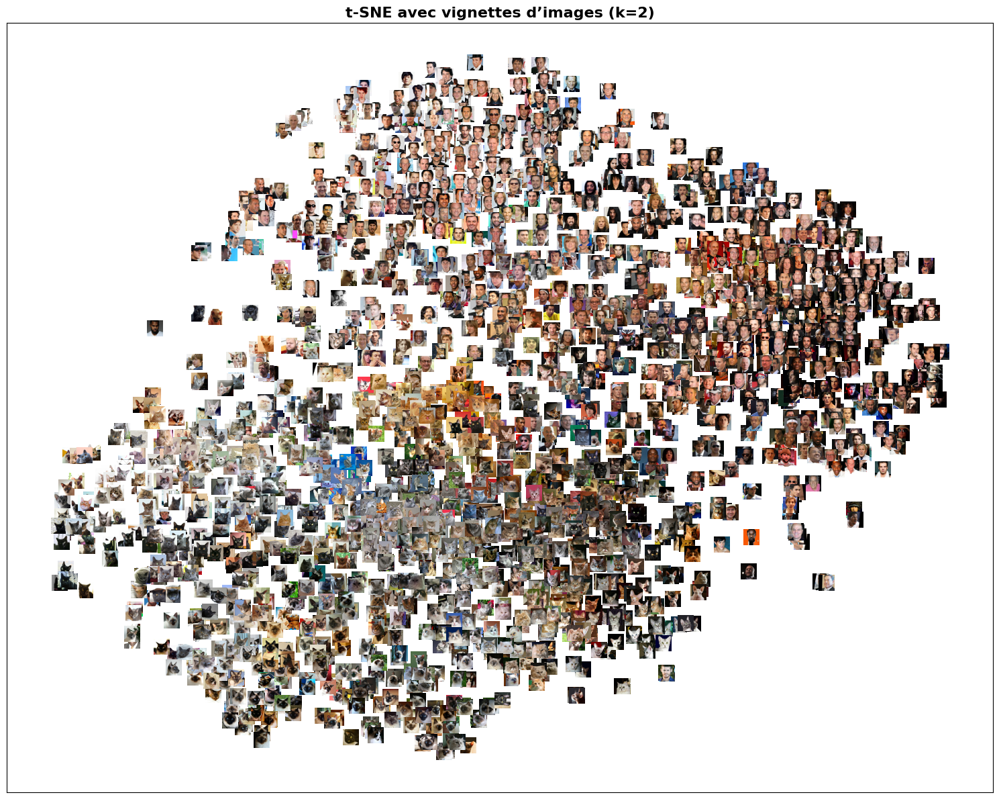

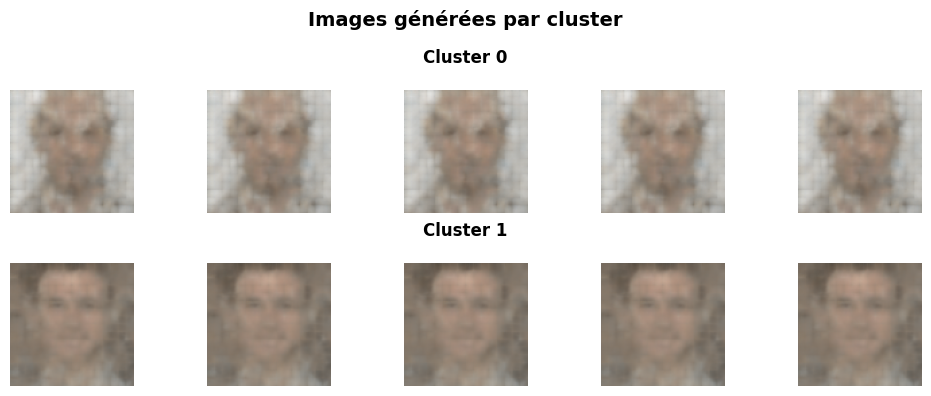

In [37]:
x, z, cluster_labels, best_k, images_by_cluster = generate_images_with_kmeans_from_images(
    model=vae_humain_chat,
    dataset_name="humain_chat",
    dataset_paths=dataset_configs,
    model_dir=model_dir,
    num_samples=10
)

plot_tsne_image_thumbnails(x, z, best_k=best_k)

plot_images_by_cluster(images_by_cluster)

### morphing (lerp inter-classes)

In [41]:
def generate_interpolated_images_from_images(
    model,
    dataset_name,
    dataset_paths,
    model_dir,
    class1,
    class2,
    num_steps=10,
    seed=None
):
    """
    Génère une interpolation entre deux images de classes différentes.


    Args:
        model        : VAE complet (contenant "vae_encoder_output" et
        "vae_decoder")
        dataset_name : nom du dataset
        dataset_paths: dictionnaire des chemins vers les datasets
        model_dir    : dossier contenant les fichiers .npz (filenames + labels)
        class1       : nom de la première classe (ex: "humain")
        class2       : nom de la seconde classe (ex: "chat")
        num_steps    : nombre d'étapes d'interpolation
        seed         : graine optionnelle pour choisir de manière reproductible
        les images sources à interpoler

    Returns:
        interpolated_images : liste des images interpolées
    """
    dataset_dir = dataset_paths[dataset_name]["path"]
    rng = np.random.default_rng(seed) if seed is not None else None

    # Charger les fichiers et labels
    label_path = os.path.join(model_dir, f"{dataset_name}_image_labels.npz")
    data = np.load(label_path)
    filenames = data["filenames"]
    labels = data["labels"]

    def get_image_by_class(target_class):
        target_class = target_class.lower()
        candidate_files = [
            file_name for file_name, label in zip(filenames, labels)
            if str(label).lower() == target_class
        ]

        if not candidate_files:
            raise ValueError(f"Aucune image pour la classe '{target_class}'.")

        if rng is None:
            selected_file = candidate_files[0]
        else:
            selected_file = candidate_files[rng.integers(len(candidate_files))]

        img = np.array(Image.open(os.path.join(dataset_dir, selected_file))) / 255.0
        return np.expand_dims(img, axis=0)

    # Encoder
    encoder = Model(inputs=model.input,
                    outputs=model.get_layer("vae_encoder_output").output)
    decoder = model.get_layer("vae_decoder")

    x1 = get_image_by_class(class1)
    x2 = get_image_by_class(class2)

    z1 = encoder.predict(x1, verbose=0)[0]
    z2 = encoder.predict(x2, verbose=0)[0]

    interpolated_images = []
    for alpha in np.linspace(0, 1, num_steps):
        z_interp = (1 - alpha) * z1 + alpha * z2
        x_gen = decoder.predict(np.expand_dims(z_interp, axis=0), verbose=0)[0]
        interpolated_images.append(np.clip(x_gen * 255, 0, 255).astype(np.uint8))

    return interpolated_images

In [39]:
def display_generated_images(images, category_name="", figsize=(15, 2),
                             cmap=None):
    """
    Affiche les images générées côte à côte avec un titre.

    Args:
        images (list[np.ndarray]): Liste d'images à afficher.
        category_name (str): Titre à afficher au-dessus des images.
        figsize (tuple): Taille de la figure matplotlib.
        cmap (str or None): Colormap à appliquer si les images sont en niveaux
        de gris.
    """
    num_images = len(images)
    fig, axes = plt.subplots(1, num_images, figsize=figsize, squeeze=False)
    fig.suptitle(category_name, fontsize=16, fontweight='bold')

    for i, img in enumerate(images):
        ax = axes[0, i]
        ax.imshow(img, cmap=cmap)
        ax.axis("off")

    plt.tight_layout()
    plt.show()

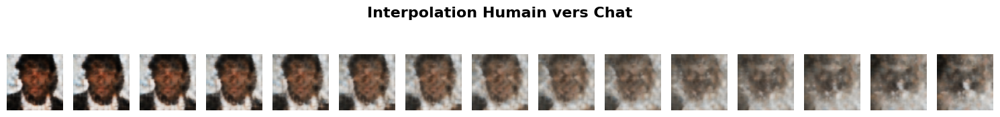

In [42]:
interpolated_images = generate_interpolated_images_from_images(
    model=vae_humain_chat,
    dataset_name="humain_chat",
    dataset_paths=dataset_configs,
    model_dir=model_dir,
    class1="humain",
    class2="chat",
    num_steps=15,
    seed=324
)

display_generated_images(interpolated_images,
                         category_name="Interpolation Humain vers Chat")